#### NOVA IMS / BSc in Data Science / Text Mining 2024/2025
### <b>Group Project: "Solving the Hyderabadi Word Soup"</b>
#### Notebook `Topic Modelling`

#### Group 10:
- `Adriana Pinto - 20221921`
- `David Duarte - 20221899`
- `Maria Teresa Silva - 20221821`
- `Marta Alves - 20221890` 
- `Miguel Nascimento - 20221876` 

#### <font color='#BFD72'>Table of Contents </font> <a class="anchor" id='toc'></a> 
- [1. Imports](#imports)
- [2. Text Preprocessing](#text-preprocessing) 
- [3. Topic Modelling (Information Requirement 3322)](#topic-modelling)
  - [3.1 LSA vs LDA vs BERTopic](#lsa-vs-lda-vs-bertopic)
    - [3.1.1 LSA](#lsa)
    - [3.1.2 LDA](#lda)
    - [3.1.3 BERTopic](#bertopic)
    - [3.1.4 Conclusion](#conclusion)
  - [3.2 BERTopic Final Approach](#bertopic---final-approach)
    - [3.2.1 First Round](#first-round)
    - [3.2.2 Second Round](#second-round)
    - [3.2.3 Third Round](#third-round)
    - [3.2.4 Fourth Round](#fourth-round)
    - [3.2.5 Final Round](#final-round)
    - [3.2.6 Final Topics](#final-topics)
    - [3.2.7 Grid Search (not used)](#grid-search-not-used)

# <font color='#BFD72'>Imports</font> 
[Back to TOC](#toc)

In [373]:
%load_ext autoreload
%autoreload 2

import numpy as np
import pandas as pd

from utils.gibberish_detector import classify_gibberish
from utils.preproc_utils import main_pipeline

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.cluster import HDBSCAN

from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora.dictionary import Dictionary

from bertopic import BERTopic

import umap
import plotly.express as px
import seaborn as sns
sns.set_style('whitegrid')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
reviews = pd.read_pickle('data/reviews_initial_preproc.pkl')

# <font color='#BFD72'>Text Preprocessing</font>
[Back to TOC](#toc)

We will preprocess the reviews, removing unwanted characthers, punctuation, emojis and stopwords (though maintaining words that can alter the meaning of the reviews - as negative adverbs). <br>
After initial tests, the word `good` was also removed as it was considered as noise as affected negatively the topic formation.

In [6]:
reviews['rev_proc'] = reviews['Review'].apply(lambda review: main_pipeline(review,
                                                                        no_stopwords = True,
                                                                        custom_stopwords = ['good'],
                                                                        exception_stopwords=['no','not','nor','very','few','all','again','but'],
                                                                        convert_diacritics = True, 
                                                                        lowercase = True, 
                                                                        lemmatized = True,
                                                                        stemmed = False, 
                                                                        pos_tags_list = "no_pos",
                                                                        tokenized_output = False,
                                                                        word_correction=False))

Gibberish will be filtered at the 90th percentile as most unclean text was already treated in the preprocessing phase.

In [7]:
reviews["is_giberish"] = reviews["rev_proc"].apply(lambda review : classify_gibberish(str(review)))
reviews = reviews[reviews['is_giberish']<90]

In [ ]:
bow_vectorizer = CountVectorizer(ngram_range=(1,1), token_pattern=r"(?u)\b\w+\b")
reviews_bow_matrix = bow_vectorizer.fit_transform(reviews["rev_proc"]).toarray()
reviews["bow_vector"] = reviews_bow_matrix.tolist()

'tfidf_vectorizer = TfidfVectorizer(ngram_range=(1,2), token_pattern=r"(?u)\x08\\w+\x08")\nreviews_tfidf_matrix = tfidf_vectorizer.fit_transform(reviews["rev_proc"]).toarray()\nreviews["tfidf_vector"] = reviews_tfidf_matrix.tolist()'

In [9]:
reviews_bow_matrix = np.array([[component for component in doc] for doc in reviews["bow_vector"]])

# <font color='#BFD72'>Topic Modelling</font>
[Back to TOC](#toc)

## LSA vs LDA vs BERTopic

This section aims to compare the performance of these 3 algorithms to perform topic modelling. They will be compared by calculating the c_v coherence score and by humanly check the coherence of the topics by looking at the top 10 words that represent each topic. It will be tested with the most basic possible parameters and n_grams_range=(1,1).

### LSA

In [10]:
lsa = TruncatedSVD(n_components=10) 
lsa_result = lsa.fit_transform(reviews_bow_matrix)

In [11]:
bow_vocab = bow_vectorizer.get_feature_names_out()

In [17]:
def get_top_words(components, feature_names, n_top_words=10):
    topics = []
    for topic_idx, topic in enumerate(components):
        top_words = [feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]
        topics.append(top_words)
    return topics

In [18]:
pd.DataFrame(get_top_words(lsa.components_, bow_vocab, 10))

,0,1,2,3,4,5,6,7,8,9
0,not,place,food,5,chicken,but,taste,very,order,service
1,5,4,3,ambience,service,food,value,2,ambiance,wrap
2,chicken,taste,biryani,dish,fry,veg,fish,rice,try,spicy
3,not,5,order,but,bad,even,no,3,restaurant,say
4,place,5,one,not,visit,go,say,cake,would,best
5,very,n,service,5,nice,staff,bad,not,cake,also
6,order,chicken,place,biryani,very,bad,not,zomato,5,delivery
7,order,taste,one,time,but,get,restaurant,dish,love,cake
8,taste,n,food,not,but,place,very,sauce,like,quantity
9,but,biryani,veg,really,great,nice,try,ambience,taste,price


In [32]:
topics = []
for i, comp in enumerate(lsa.components_):
    topic_terms = [bow_vocab[idx] for idx in comp.argsort()[:-11:-1]]  # Top 10 terms
    topics.append(topic_terms)

coherence_model = CoherenceModel(topics=topics, 
                                texts=reviews['rev_proc'].apply(lambda x: x.split() if isinstance(x, str) else x), 
                                dictionary=Dictionary(reviews['rev_proc'].apply(lambda x: x.split() if isinstance(x, str) else x)), 
                                coherence='c_v')
coherence_model.get_coherence()

0.472099634453916

### LDA

In [35]:
lda = LatentDirichletAllocation(n_components=10,doc_topic_prior=None,topic_word_prior=None,max_iter=10,verbose=True)
lda_result = lda.fit_transform(reviews_bow_matrix)

iteration: 1 of max_iter: 10
iteration: 2 of max_iter: 10
iteration: 3 of max_iter: 10
iteration: 4 of max_iter: 10
iteration: 5 of max_iter: 10
iteration: 6 of max_iter: 10
iteration: 7 of max_iter: 10
iteration: 8 of max_iter: 10
iteration: 9 of max_iter: 10
iteration: 10 of max_iter: 10


In [36]:
pd.DataFrame(get_top_words(lda.components_, bow_vocab, 10))

,0,1,2,3,4,5,6,7,8,9
0,chicken,taste,place,biryani,food,paneer,order,try,but,veg
1,5,4,3,service,food,ambience,2,place,value,order
2,cream,chicken,ice,try,taste,dish,like,fry,noodle,but
3,not,order,biryani,chicken,taste,food,but,very,delivery,bad
4,food,bad,excellent,service,ever,haleem,best,very,no,place
5,not,food,but,veg,taste,starter,serve,buffet,restaurant,very
6,place,try,food,very,one,taste,must,price,also,best
7,not,place,food,but,service,go,order,one,even,take
8,place,food,very,service,great,nice,ambience,visit,staff,really
9,not,cake,chocolate,place,but,coffee,momos,pizza,cafe,brownie


In [37]:
topics = []
for i, comp in enumerate(lda.components_):
    topic_terms = [bow_vocab[idx] for idx in comp.argsort()[:-11:-1]]  # Top 10 terms
    topics.append(topic_terms)

coherence_model = CoherenceModel(topics=topics, 
                                texts=reviews['rev_proc'].apply(lambda x: x.split() if isinstance(x, str) else x), 
                                dictionary=Dictionary(reviews['rev_proc'].apply(lambda x: x.split() if isinstance(x, str) else x)), 
                                coherence='c_v')
coherence_model.get_coherence()

0.4662596224741599

### BERTopic

In [38]:
bert = BERTopic(nr_topics=10, n_gram_range=(1,1), verbose=True) 
docs = reviews["rev_proc"].reset_index(drop=True)
topics, probs = bert.fit_transform(docs)

2024-12-20 10:14:24,918 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/310 [00:00<?, ?it/s]

2024-12-20 10:15:23,973 - BERTopic - Embedding - Completed ✓
2024-12-20 10:15:23,973 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-20 10:15:47,220 - BERTopic - Dimensionality - Completed ✓
2024-12-20 10:15:47,283 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-20 10:15:47,749 - BERTopic - Cluster - Completed ✓
2024-12-20 10:15:47,749 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-20 10:15:48,111 - BERTopic - Representation - Completed ✓
2024-12-20 10:15:48,111 - BERTopic - Topic reduction - Reducing number of topics
2024-12-20 10:15:48,506 - BERTopic - Topic reduction - Reduced number of topics from 126 to 10


In [ ]:
bert.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,4387,-1_food_place_not_service,"[food, place, not, service, but, very, order, ...",[close house sln terminus one place often visi...
1,0,4373,0_food_not_place_very,"[food, not, place, very, chicken, taste, but, ...",[best rooftop restaurant gachibowli great food...
2,1,579,1_nice_excellent_very_awesome,"[nice, excellent, very, awesome, bad, not, gud...","[very nice, very nice, very nice]"
3,2,325,2_delivery_deliver_time_order,"[delivery, deliver, time, order, fast, not, la...","[delivery, delivery, delivery time delivery]"
4,3,78,3_service_job_test_very,"[service, job, test, very, excellent, fast, th...","[service, service, service]"
5,4,73,4_quantity_less_quality_suck,"[quantity, less, quality, suck, low, money, ve...","[quantity less, less quantity, less quantity]"
6,5,36,5_super_superb_simply_delevery,"[super, superb, simply, delevery, supersupersu...","[super, super, super]"
7,6,22,6_time_right_vey_ontime,"[time, right, vey, ontime, deli, come, better,...","[time, time, time]"
8,7,20,7_pack_cover_plastic_box,"[pack, cover, plastic, box, package, improve, ...","[pack not all, food pack, pack not]"
9,8,13,8_average_expect_piece_qty,"[average, expect, piece, qty, slightly, large,...","[average, average, average]"


In [19]:
def compute_coherence_score(model, documents, coherence='c_v'):
    topics = model.get_topics()  # Get topic representations
    topic_words = [[word for word, _ in words] for words in topics.values()]  # Extract words for each topic

    # Preprocess documents for Gensim
    tokenized_docs = [doc.split() for doc in documents]  # Tokenize documents
    dictionary = Dictionary(tokenized_docs)  # Create Gensim dictionary
    corpus = [dictionary.doc2bow(doc) for doc in tokenized_docs]  # Create corpus

    # Compute coherence
    coherence_model = CoherenceModel(
        topics=topic_words,
        texts=tokenized_docs,
        dictionary=dictionary,
        coherence=coherence,
    )
    return coherence_model.get_coherence()

In [41]:
compute_coherence_score(bert, docs)

0.35805664147042393

### Conclusion

Even though LSA could achieve higher coherence scores, we believe that the resulting topics and corresponding most frequent words were not significant. BERTopic while having a lower coherence score, could create more relevant topics and also allows a better personalization of hyperparameteres. Therefore, we chose to continue with this model. <br>
To further test BERTopic, a grid search was implemented that also allowed testing different preprocessing hyperparameters. However, due to the amount of time it took to run even for a small parameter grid and as it was only focused on the coherence score, it did not allow the human part of analysing how well the topics reflected the reviews. Therefore, it was not used as part of the final strategy to define the topics and the preprocessing steps were determined by intuition according to what we thought would work better to extract the topics and are the same as used in this comparison. The grid search code can be found [here](#grid-search-not-used).

## BERTopic - Final Approach

The following approach was used:
- 1st Step: Apply BERTopic with HDBSCAN while testing hyperparameters to better define the topics. 

- 2nd Step: Identify the well define topics and label the corresponding reviews. 

- 3rd Step: Repeat the 1st step until all reviews are labeled. 

Note: n_grams will be set to (1,2) in order to capture underlying patterns of bigrams like `very bad` or `chicken biryani` and HDBSCAN hyperparameters will be manually defined.

### First Round

In [158]:
hd = HDBSCAN(min_cluster_size=45, min_samples=3)

In [159]:
topic_model = BERTopic(nr_topics=8, hdbscan_model=hd, n_gram_range=(1,2), verbose=True) 
docs = reviews["rev_proc"].reset_index(drop=True)
topics, probs = topic_model.fit_transform(docs)
reviews_topics_df = pd.DataFrame({'topic': topics, 'document': docs})

2024-12-20 11:42:07,659 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/310 [00:00<?, ?it/s]

2024-12-20 11:43:13,914 - BERTopic - Embedding - Completed ✓
2024-12-20 11:43:13,915 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-20 11:43:18,500 - BERTopic - Dimensionality - Completed ✓
2024-12-20 11:43:18,502 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-20 11:43:19,035 - BERTopic - Cluster - Completed ✓
2024-12-20 11:43:19,035 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-20 11:43:19,997 - BERTopic - Representation - Completed ✓
2024-12-20 11:43:20,000 - BERTopic - Topic reduction - Reducing number of topics
2024-12-20 11:43:20,992 - BERTopic - Topic reduction - Reduced number of topics from 48 to 8


In [160]:
compute_coherence_score(topic_model, docs)

0.4632984517424835

In [161]:
topics_info = topic_model.get_topic_info()
topics_info

,Topic,Count,Name,Representation,Representative_Docs
0,-1,3905,-1_food_place_not_service,"[food, place, not, service, very, but, order, ...",[yet another sunday even quite late reach plac...
1,0,4816,0_not_food_place_very,"[not, food, place, very, but, chicken, order, ...",[very nice place ambience different all food o...
2,1,326,1_nom_hmmm_fast delievery_verry yuck,"[nom, hmmm, fast delievery, verry yuck, nom bh...","[bekar, fast delievery, owm nom nom]"
3,2,325,2_delivery_time_deliver_fast,"[delivery, time, deliver, fast, time delivery,...","[delivery, delivery, delivery]"
4,3,280,3_food_not_super_taste,"[food, not, super, taste, bad, tasty, awesome,...","[food, food, food]"
5,4,119,4_nice_nice nice_excellent_nice excellent,"[nice, nice nice, excellent, nice excellent, e...","[nice, nice, nice]"
6,5,82,5_quantity_less_less quantity_quality,"[quantity, less, less quantity, quality, quant...","[less quantity, less quantity, less quantity]"
7,6,53,6_spicy_spicy food_very spicy_not,"[spicy, spicy food, very spicy, not, spicy spi...","[spicy, spicy, spicy]"


In [162]:
topic_model.visualize_barchart()

The topics that will be kept are the ones selected on the `visualize_documents` visualizations.

In [163]:
topic_model.visualize_documents(docs)

In [164]:
reviews_topics_df.index = reviews.index

In [165]:
reviews_topics_df_with_rep = pd.merge(reviews_topics_df, topics_info[['Topic','Representation']], left_on=reviews_topics_df.topic, right_on=topics_info['Topic'], how='left').drop(['key_0','Topic'], axis=1).set_index(reviews_topics_df.index)
reviews_topics_df_with_rep

,topic,document,Representation
0,0,ambience food quite saturday lunch cost effect...,"[not, food, place, very, but, chicken, order, ..."
1,-1,ambience pleasant even service very prompt foo...,"[food, place, not, service, very, but, order, ..."
2,0,must try great food great ambience thnx servic...,"[not, food, place, very, but, chicken, order, ..."
3,0,soumen da arun great guy behavior sincerety fo...,"[not, food, place, very, but, chicken, order, ..."
4,-1,food order kodi drumstick basket mutton biryan...,"[food, place, not, service, very, but, order, ..."
...,...,...,...
9901,-1,madhumathi mahajan well start nice courteous s...,"[food, place, not, service, very, but, order, ..."
9902,0,place never disappoint u food courteous staff ...,"[not, food, place, very, but, chicken, order, ..."
9903,0,bad rat mainly chicken bone find veg food not ...,"[not, food, place, very, but, chicken, order, ..."
9904,-1,personally love prefer chinese food couple tim...,"[food, place, not, service, very, but, order, ..."


In [166]:
good_rep = reviews_topics_df_with_rep['Representation'].value_counts().keys().tolist()
good_rep= [good_rep[i] for i in [3,5,6,7]] 

In [ ]:
reviews = pd.merge(reviews, reviews_topics_df_with_rep['Representation'], left_on=reviews.index, right_on=reviews_topics_df_with_rep.index, how='left')
for idx, row in reviews.iterrows():
    if row['Representation'] not in good_rep:
         reviews.loc[idx, 'Representation'] = None

reviews.drop('key_0', axis=1, inplace=True)
reviews.head()

,Restaurant,Reviewer,Review,Rating,Time,Pictures,N_reviews,Followers,Month,Year,Weekend,Post_Meal,rev_len,nr_sents,rev_proc,is_giberish,bow_vector,Representation
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . h...",5.0,2019-05-25 15:54:00,0,1,2,5,2019,1,1,224,5,ambience food quite saturday lunch cost effect...,1.000000,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,5.0,2019-05-25 14:20:00,0,3,2,5,2019,1,1,144,5,ambience pleasant even service very prompt foo...,24.711918,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,5.0,2019-05-24 22:54:00,0,2,3,5,2019,0,1,189,3,must try great food great ambience thnx servic...,1.000000,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
3,Beyond Flavours,Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,5.0,2019-05-24 22:11:00,0,1,1,5,2019,0,1,148,2,soumen da arun great guy behavior sincerety fo...,27.806469,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and ba...,5.0,2019-05-24 21:37:00,0,3,2,5,2019,0,1,160,6,food order kodi drumstick basket mutton biryan...,1.000000,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None


### Second Round

In [171]:
reviews_to_topic = reviews[reviews.Representation.isna()]

In [172]:
reviews.Representation.value_counts()

[delivery, time, deliver, fast, time delivery, fast delivery, delivery time, order, very, delivery delivery]                   325
[nice, nice nice, excellent, nice excellent, excellent nice, excellent excellent, very nice, nice very, thank, ok]             119
[quantity, less, less quantity, quality, quantity less, quantity very, very, quantity suck, quantity not, service quantity]     82
[spicy, spicy food, very spicy, not, spicy spicy, not spicy, food, very, but, spicy but]                                        53
Name: Representation, dtype: int64

In [182]:
hd = HDBSCAN(min_cluster_size=35, min_samples=4)

In [183]:
topic_model = BERTopic(nr_topics=8, hdbscan_model=hd, n_gram_range=(1,2), verbose=True) 
docs = reviews_to_topic["rev_proc"].reset_index(drop=True)
topics, probs = topic_model.fit_transform(docs)
reviews_topics_df = pd.DataFrame({'topic': topics, 'document': docs})

2024-12-20 11:50:47,954 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/292 [00:00<?, ?it/s]

2024-12-20 11:51:52,842 - BERTopic - Embedding - Completed ✓
2024-12-20 11:51:52,843 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-20 11:51:57,140 - BERTopic - Dimensionality - Completed ✓
2024-12-20 11:51:57,142 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-20 11:51:57,606 - BERTopic - Cluster - Completed ✓
2024-12-20 11:51:57,607 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-20 11:51:58,688 - BERTopic - Representation - Completed ✓
2024-12-20 11:51:58,690 - BERTopic - Topic reduction - Reducing number of topics
2024-12-20 11:51:59,956 - BERTopic - Topic reduction - Reduced number of topics from 10 to 8


In [186]:
compute_coherence_score(topic_model, docs)

0.4638147257966437

In [184]:
topics_info = topic_model.get_topic_info()
topics_info

,Topic,Count,Name,Representation,Representative_Docs
0,-1,126,-1_super_awesome_awesome awesome_very,"[super, awesome, awesome awesome, very, food, ...","[super, super, awesome awesome awesome]"
1,0,8594,0_food_place_not_very,"[food, place, not, very, but, service, order, ...",[look like sport bar proper setup but people a...
2,1,321,1_yup_verry yuck_yup hmmm_nil bhehave,"[yup, verry yuck, yup hmmm, nil bhehave, hmmm ...","[yup, hmmm, hhsjoibohoogogigivigigu8gihohohohp..."
3,2,92,2_not_time_gud_job,"[not, time, gud, job, not time, not not, time ...","[not, not, not time]"
4,3,82,3_tasty_food_awesome_food awesome,"[tasty, food, awesome, food awesome, awesome f...","[food awesome, food awesome, food awesome]"
5,4,41,4_taste_taste taste_bad taste_taste not,"[taste, taste taste, bad taste, taste not, sal...","[taste, taste, taste]"
6,5,36,5_bad_bad bad_not bad_very bad,"[bad, bad bad, not bad, very bad, bad very, no...","[bad, bad, bad]"
7,6,35,6_service service_service_fast service_service...,"[service service, service, fast service, servi...","[service, service, service]"


In [185]:
topic_model.visualize_barchart()

In [187]:
topic_model.visualize_documents(docs)

In [188]:
reviews_topics_df.index = reviews_to_topic.index

In [189]:
reviews_topics_df_with_rep = pd.merge(reviews_topics_df, topics_info[['Topic','Representation']], left_on=reviews_topics_df.topic, right_on=topics_info['Topic'], how='left').drop(['key_0','Topic'], axis=1).set_index(reviews_topics_df.index)
reviews_topics_df_with_rep

,topic,document,Representation
0,0,ambience food quite saturday lunch cost effect...,"[food, place, not, very, but, service, order, ..."
1,0,ambience pleasant even service very prompt foo...,"[food, place, not, very, but, service, order, ..."
2,0,must try great food great ambience thnx servic...,"[food, place, not, very, but, service, order, ..."
3,0,soumen da arun great guy behavior sincerety fo...,"[food, place, not, very, but, service, order, ..."
4,0,food order kodi drumstick basket mutton biryan...,"[food, place, not, very, but, service, order, ..."
...,...,...,...
9901,0,madhumathi mahajan well start nice courteous s...,"[food, place, not, very, but, service, order, ..."
9902,0,place never disappoint u food courteous staff ...,"[food, place, not, very, but, service, order, ..."
9903,0,bad rat mainly chicken bone find veg food not ...,"[food, place, not, very, but, service, order, ..."
9904,0,personally love prefer chinese food couple tim...,"[food, place, not, very, but, service, order, ..."


In [190]:
good_rep = reviews_topics_df_with_rep['Representation'].value_counts().keys().tolist()
good_rep= [good_rep[i] for i in [4,5,6,7]] 

In [ ]:
reviews = pd.merge(reviews, reviews_topics_df_with_rep, left_on=reviews.index, right_on=reviews_topics_df_with_rep.index, how='left').drop(['key_0','document','topic'], axis=1)
for idx, row in reviews.iterrows():
    if row['Representation_y'] in good_rep:
        if row['Representation_x'] is None:
            reviews.at[idx, 'Representation_x'] = row['Representation_y']

reviews.drop('Representation_y', axis=1, inplace=True)
reviews.head()

,Restaurant,Reviewer,Review,Rating,Time,Pictures,N_reviews,Followers,Month,Year,Weekend,Post_Meal,rev_len,nr_sents,rev_proc,is_giberish,bow_vector,Representation_x
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . h...",5.0,2019-05-25 15:54:00,0,1,2,5,2019,1,1,224,5,ambience food quite saturday lunch cost effect...,1.000000,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,5.0,2019-05-25 14:20:00,0,3,2,5,2019,1,1,144,5,ambience pleasant even service very prompt foo...,24.711918,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,5.0,2019-05-24 22:54:00,0,2,3,5,2019,0,1,189,3,must try great food great ambience thnx servic...,1.000000,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
3,Beyond Flavours,Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,5.0,2019-05-24 22:11:00,0,1,1,5,2019,0,1,148,2,soumen da arun great guy behavior sincerety fo...,27.806469,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and ba...,5.0,2019-05-24 21:37:00,0,3,2,5,2019,0,1,160,6,food order kodi drumstick basket mutton biryan...,1.000000,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None


In [194]:
reviews['Representation_x'].value_counts()

[delivery, time, deliver, fast, time delivery, fast delivery, delivery time, order, very, delivery delivery]                      325
[nice, nice nice, excellent, nice excellent, excellent nice, excellent excellent, very nice, nice very, thank, ok]                119
[quantity, less, less quantity, quality, quantity less, quantity very, very, quantity suck, quantity not, service quantity]        82
[tasty, food, awesome, food awesome, awesome food, tasty food, tasty excellent, but expensive, food tasty, nice]                   82
[spicy, spicy food, very spicy, not, spicy spicy, not spicy, food, very, but, spicy but]                                           53
[taste, taste taste, bad taste, taste not, salty, bad, not taste, super taste, very salty, taste love]                             41
[bad, bad bad, not bad, very bad, bad very, not, very, decent not, bad ever, ever not]                                             36
[service service, service, fast service, service fast, fast, s

### Third Round

In [195]:
reviews_to_topic = reviews[reviews['Representation_x'].isna()]

In [206]:
hd = HDBSCAN(min_cluster_size=25, min_samples=3)

In [207]:
topic_model = BERTopic(nr_topics=8, hdbscan_model=hd, n_gram_range=(1,2), verbose=True) 
docs = reviews_to_topic["rev_proc"].reset_index(drop=True)
topics, probs = topic_model.fit_transform(docs)
reviews_topics_df = pd.DataFrame({'topic': topics, 'document': docs})

2024-12-20 11:59:28,733 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/286 [00:00<?, ?it/s]

2024-12-20 12:00:32,584 - BERTopic - Embedding - Completed ✓
2024-12-20 12:00:32,585 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-20 12:00:36,825 - BERTopic - Dimensionality - Completed ✓
2024-12-20 12:00:36,827 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-20 12:00:37,321 - BERTopic - Cluster - Completed ✓
2024-12-20 12:00:37,322 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-20 12:00:38,309 - BERTopic - Representation - Completed ✓
2024-12-20 12:00:38,311 - BERTopic - Topic reduction - Reducing number of topics
2024-12-20 12:00:39,321 - BERTopic - Topic reduction - Reduced number of topics from 68 to 8


In [211]:
compute_coherence_score(topic_model, docs)

0.48468066223108963

In [208]:
topics_info = topic_model.get_topic_info()
topics_info

,Topic,Count,Name,Representation,Representative_Docs
0,-1,3112,-1_food_place_not_very,"[food, place, not, very, service, but, taste, ...",[well go lot positive review finally decide vi...
1,0,5404,0_not_food_place_very,"[not, food, place, very, but, order, chicken, ...",[arena eleven sport bar ipl good way enjoy wat...
2,1,448,1_super_awesome_awesome awesome_not,"[super, awesome, awesome awesome, not, gud, jo...","[super, super, super]"
3,2,51,2_time_food_food time_time food,"[time, food, food time, time food, food food, ...","[time, time, time]"
4,3,34,3_oily_oil_very oily_rotis,"[oily, oil, very oily, rotis, very, much oil, ...","[taste but very oily, very oily, very oily]"
5,4,29,4_pack_food pack_box_food,"[pack, food pack, box, food, cover, pack food,...",[very bad pack food all get mix could not meal...
6,5,28,5_very very_very_very one_one very,"[very very, very, very one, one very, one, , ,...","[very, very, very]"
7,6,27,6_pizza_cheese_not_order,"[pizza, cheese, not, order, pizza not, margher...",[fully disappoint order double cheese margheri...


In [209]:
topic_model.visualize_barchart()

In [210]:
topic_model.visualize_documents(docs)

In [212]:
reviews_topics_df.index = reviews_to_topic.index

In [213]:
reviews_topics_df_with_rep = pd.merge(reviews_topics_df, topics_info[['Topic','Representation']], left_on=reviews_topics_df.topic, right_on=topics_info['Topic'], how='left').drop(['key_0','Topic'], axis=1).set_index(reviews_topics_df.index)
reviews_topics_df_with_rep

,topic,document,Representation
0,-1,ambience food quite saturday lunch cost effect...,"[food, place, not, very, service, but, taste, ..."
1,-1,ambience pleasant even service very prompt foo...,"[food, place, not, very, service, but, taste, ..."
2,0,must try great food great ambience thnx servic...,"[not, food, place, very, but, order, chicken, ..."
3,0,soumen da arun great guy behavior sincerety fo...,"[not, food, place, very, but, order, chicken, ..."
4,-1,food order kodi drumstick basket mutton biryan...,"[food, place, not, very, service, but, taste, ..."
...,...,...,...
9901,0,madhumathi mahajan well start nice courteous s...,"[not, food, place, very, but, order, chicken, ..."
9902,0,place never disappoint u food courteous staff ...,"[not, food, place, very, but, order, chicken, ..."
9903,0,bad rat mainly chicken bone find veg food not ...,"[not, food, place, very, but, order, chicken, ..."
9904,-1,personally love prefer chinese food couple tim...,"[food, place, not, very, service, but, taste, ..."


In [214]:
good_rep = reviews_topics_df_with_rep['Representation'].value_counts().keys().tolist()
good_rep= [good_rep[i] for i in [2,4,5,7]] 

In [ ]:
reviews = pd.merge(reviews, reviews_topics_df_with_rep, left_on=reviews.index, right_on=reviews_topics_df_with_rep.index, how='left').drop(['key_0','document','topic'], axis=1)
for idx, row in reviews.iterrows():
    if row['Representation'] in good_rep:
        if row['Representation_x'] is None:
            reviews.at[idx, 'Representation_x'] = row['Representation']

reviews.drop('Representation', axis=1, inplace=True)
reviews.head()

,Restaurant,Reviewer,Review,Rating,Time,Pictures,N_reviews,Followers,Month,Year,Weekend,Post_Meal,rev_len,nr_sents,rev_proc,is_giberish,bow_vector,Representation_x
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . h...",5.0,2019-05-25 15:54:00,0,1,2,5,2019,1,1,224,5,ambience food quite saturday lunch cost effect...,1.000000,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,5.0,2019-05-25 14:20:00,0,3,2,5,2019,1,1,144,5,ambience pleasant even service very prompt foo...,24.711918,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,5.0,2019-05-24 22:54:00,0,2,3,5,2019,0,1,189,3,must try great food great ambience thnx servic...,1.000000,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
3,Beyond Flavours,Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,5.0,2019-05-24 22:11:00,0,1,1,5,2019,0,1,148,2,soumen da arun great guy behavior sincerety fo...,27.806469,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and ba...,5.0,2019-05-24 21:37:00,0,3,2,5,2019,0,1,160,6,food order kodi drumstick basket mutton biryan...,1.000000,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None


In [218]:
reviews['Representation_x'].value_counts()

[super, awesome, awesome awesome, not, gud, job, super not, not super, test, not not]                                             448
[delivery, time, deliver, fast, time delivery, fast delivery, delivery time, order, very, delivery delivery]                      325
[nice, nice nice, excellent, nice excellent, excellent nice, excellent excellent, very nice, nice very, thank, ok]                119
[quantity, less, less quantity, quality, quantity less, quantity very, very, quantity suck, quantity not, service quantity]        82
[tasty, food, awesome, food awesome, awesome food, tasty food, tasty excellent, but expensive, food tasty, nice]                   82
[spicy, spicy food, very spicy, not, spicy spicy, not spicy, food, very, but, spicy but]                                           53
[taste, taste taste, bad taste, taste not, salty, bad, not taste, super taste, very salty, taste love]                             41
[bad, bad bad, not bad, very bad, bad very, not, very, decent 

### Fourth Round

In [219]:
reviews_to_topic = reviews[reviews['Representation_x'].isna()]

In [224]:
hd = HDBSCAN(min_cluster_size=25, min_samples=2)

In [225]:
topic_model = BERTopic(nr_topics=10, hdbscan_model=hd, n_gram_range=(1,2), verbose=True) 
docs = reviews_to_topic["rev_proc"].reset_index(drop=True)
topics, probs = topic_model.fit_transform(docs)
reviews_topics_df = pd.DataFrame({'topic': topics, 'document': docs})

2024-12-20 12:17:26,692 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/269 [00:00<?, ?it/s]

2024-12-20 12:18:29,472 - BERTopic - Embedding - Completed ✓
2024-12-20 12:18:29,473 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-20 12:18:33,276 - BERTopic - Dimensionality - Completed ✓
2024-12-20 12:18:33,278 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-20 12:18:33,669 - BERTopic - Cluster - Completed ✓
2024-12-20 12:18:33,670 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-20 12:18:34,734 - BERTopic - Representation - Completed ✓
2024-12-20 12:18:34,737 - BERTopic - Topic reduction - Reducing number of topics
2024-12-20 12:18:35,955 - BERTopic - Topic reduction - Reduced number of topics from 84 to 10


In [20]:
compute_coherence_score(topic_model, docs)

0.44862023024896197

In [226]:
topics_info = topic_model.get_topic_info()
topics_info

,Topic,Count,Name,Representation,Representative_Docs
0,-1,2875,-1_food_place_not_service,"[food, place, not, service, very, but, order, ...",[food place nice except murg malai tikka dish ...
1,0,2978,0_place_food_very_service,"[place, food, very, service, not, chicken, amb...",[best place ever jonathan kitchen near gachibo...
2,1,1497,1_biryani_order_chicken_not,"[biryani, order, chicken, not, taste, food, bu...",[order chicken biryani restaurant full excitem...
3,2,470,2_cake_cream_chocolate_ice,"[cake, cream, chocolate, ice, ice cream, not, ...",[huge fan cream stone death chocolate ice crea...
4,3,376,3_not_service_bad_food,"[not, service, bad, food, place, but, rat, no,...",[rat food taste always 4 5 but come service no...
5,4,218,4_zomato_order_not_deliver,"[zomato, order, not, deliver, delivery, restau...",[delivery poor customer support zomato unable ...
6,5,75,5_burger_chicken_grill_taste,"[burger, chicken, grill, taste, milky way, gal...",[worst burger ever eat place really bad compar...
7,6,52,6_time_food_food time_time food,"[time, food, food time, time food, food food, ...","[time, time, time]"
8,7,28,7_very very_very_very one_one very,"[very very, very, very one, one very, one, , ,...","[very, very, very]"
9,8,26,8_rice_rice not_not_not cook,"[rice, rice not, not, not cook, properly, hard...",[mumbai order hotel hitech city swiggy order c...


In [231]:
topic_model.visualize_barchart(top_n_topics=10)

In [228]:
topic_model.visualize_documents(docs)

In [232]:
reviews_topics_df.index = reviews_to_topic.index

In [233]:
reviews_topics_df_with_rep = pd.merge(reviews_topics_df, topics_info[['Topic','Representation']], left_on=reviews_topics_df.topic, right_on=topics_info['Topic'], how='left').drop(['key_0','Topic'], axis=1).set_index(reviews_topics_df.index)
reviews_topics_df_with_rep

,topic,document,Representation
0,0,ambience food quite saturday lunch cost effect...,"[place, food, very, service, not, chicken, amb..."
1,-1,ambience pleasant even service very prompt foo...,"[food, place, not, service, very, but, order, ..."
2,0,must try great food great ambience thnx servic...,"[place, food, very, service, not, chicken, amb..."
3,0,soumen da arun great guy behavior sincerety fo...,"[place, food, very, service, not, chicken, amb..."
4,0,food order kodi drumstick basket mutton biryan...,"[place, food, very, service, not, chicken, amb..."
...,...,...,...
9901,0,madhumathi mahajan well start nice courteous s...,"[place, food, very, service, not, chicken, amb..."
9902,0,place never disappoint u food courteous staff ...,"[place, food, very, service, not, chicken, amb..."
9903,3,bad rat mainly chicken bone find veg food not ...,"[not, service, bad, food, place, but, rat, no,..."
9904,0,personally love prefer chinese food couple tim...,"[place, food, very, service, not, chicken, amb..."


In [234]:
good_rep = reviews_topics_df_with_rep['Representation'].value_counts().keys().tolist()
good_rep= [good_rep[i] for i in [2,3,6,9]] 

In [235]:
reviews = pd.merge(reviews, reviews_topics_df_with_rep, left_on=reviews.index, right_on=reviews_topics_df_with_rep.index, how='left').drop(['key_0','document','topic'], axis=1)
for idx, row in reviews.iterrows():
    if row['Representation'] in good_rep:
        if row['Representation_x'] is None:
            reviews.at[idx, 'Representation_x'] = row['Representation']

reviews.drop('Representation', axis=1, inplace=True)
reviews.head()

,Restaurant,Reviewer,Review,Rating,Time,Pictures,N_reviews,Followers,Month,Year,Weekend,Post_Meal,rev_len,nr_sents,rev_proc,is_giberish,bow_vector,Representation_x
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . h...",5.0,2019-05-25 15:54:00,0,1,2,5,2019,1,1,224,5,ambience food quite saturday lunch cost effect...,1.000000,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,5.0,2019-05-25 14:20:00,0,3,2,5,2019,1,1,144,5,ambience pleasant even service very prompt foo...,24.711918,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,5.0,2019-05-24 22:54:00,0,2,3,5,2019,0,1,189,3,must try great food great ambience thnx servic...,1.000000,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
3,Beyond Flavours,Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,5.0,2019-05-24 22:11:00,0,1,1,5,2019,0,1,148,2,soumen da arun great guy behavior sincerety fo...,27.806469,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and ba...,5.0,2019-05-24 21:37:00,0,3,2,5,2019,0,1,160,6,food order kodi drumstick basket mutton biryan...,1.000000,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",None


In [236]:
reviews['Representation_x'].value_counts()

[biryani, order, chicken, not, taste, food, but, very, bad, shawarma]                                                             1497
[cake, cream, chocolate, ice, ice cream, not, brownie, donut, try, shake]                                                          470
[super, awesome, awesome awesome, not, gud, job, super not, not super, test, not not]                                              448
[delivery, time, deliver, fast, time delivery, fast delivery, delivery time, order, very, delivery delivery]                       325
[nice, nice nice, excellent, nice excellent, excellent nice, excellent excellent, very nice, nice very, thank, ok]                 119
[quantity, less, less quantity, quality, quantity less, quantity very, very, quantity suck, quantity not, service quantity]         82
[tasty, food, awesome, food awesome, awesome food, tasty food, tasty excellent, but expensive, food tasty, nice]                    82
[burger, chicken, grill, taste, milky way, galaxy, plac

### Final Round

In [237]:
reviews_to_topic = reviews[reviews['Representation_x'].isna()]

In [287]:
hd = HDBSCAN(min_cluster_size=15, min_samples=4)

In [291]:
topic_model = BERTopic(nr_topics=6, n_gram_range=(1,2), verbose=True) 
docs = reviews_to_topic["rev_proc"].reset_index(drop=True)
topics, probs = topic_model.fit_transform(docs)
reviews_topics_df = pd.DataFrame({'topic': topics, 'document': docs})

2024-12-20 12:59:17,040 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/204 [00:00<?, ?it/s]

2024-12-20 13:00:07,277 - BERTopic - Embedding - Completed ✓
2024-12-20 13:00:07,277 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-20 13:00:10,232 - BERTopic - Dimensionality - Completed ✓
2024-12-20 13:00:10,232 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-20 13:00:10,576 - BERTopic - Cluster - Completed ✓
2024-12-20 13:00:10,576 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-20 13:00:11,401 - BERTopic - Representation - Completed ✓
2024-12-20 13:00:11,401 - BERTopic - Topic reduction - Reducing number of topics
2024-12-20 13:00:12,293 - BERTopic - Topic reduction - Reduced number of topics from 7 to 6


In [264]:
compute_coherence_score(topic_model, docs)

0.4948172319088341

In [292]:
topics_info = topic_model.get_topic_info()
topics_info

,Topic,Count,Name,Representation,Representative_Docs
0,-1,8,-1_waste_waste waste_waste fellow_milk waste,"[waste, waste waste, waste fellow, milk waste,...","[waste, waste, waste]"
1,0,6447,0_food_place_not_service,"[food, place, not, service, very, but, chicken...",[love food especially north indian food crave ...
2,1,28,1_very very_very_very one_one very,"[very very, very, very one, one very, one, , ,...","[very, very, very]"
3,2,22,2_time_time time_right time_time right,"[time, time time, right time, time right, righ...","[time, n time, right time time]"
4,3,11,3_biryani_yuck biryani_experience biryani_biry...,"[biryani, yuck biryani, experience biryani, bi...",[biryani not all bad experience biryani hydera...
5,4,11,4_superb superb_superb_simply superb_simply,"[superb superb, superb, simply superb, simply,...","[superb, superb, superb]"


In [293]:
topic_model.visualize_barchart()

In [294]:
topic_model.visualize_documents(docs)

After extensive testing, we could not form meaningful clusters with the remaining reviews. <br>With exception to some outliers we can see that all the points belong to same cluster. <br>We will label all of them with the representation of Topic 0

In [308]:
for idx, row in reviews.iterrows():
    if row['Representation_x'] is None:
        reviews.at[idx, 'Representation_x'] = topics_info.iloc[1]['Representation']

### Final Topics

In [315]:
reviews.rename({'Representation_x':'Topic_Representation'}, axis=1, inplace=True)

In [312]:
reviews['Representation_x'].value_counts()

[food, place, not, service, very, but, chicken, taste, order, ambience]                                                           6527
[biryani, order, chicken, not, taste, food, but, very, bad, shawarma]                                                             1497
[cake, cream, chocolate, ice, ice cream, not, brownie, donut, try, shake]                                                          470
[super, awesome, awesome awesome, not, gud, job, super not, not super, test, not not]                                              448
[delivery, time, deliver, fast, time delivery, fast delivery, delivery time, order, very, delivery delivery]                       325
[nice, nice nice, excellent, nice excellent, excellent nice, excellent excellent, very nice, nice very, thank, ok]                 119
[tasty, food, awesome, food awesome, awesome food, tasty food, tasty excellent, but expensive, food tasty, nice]                    82
[quantity, less, less quantity, quality, quantity less,

We finish the process of topic modelling with 17 topics.<br>
Even though some of them are constituted by a small sample of the reviews, we believe that they are really specific and have the potential to extract meaningful insights.

In [317]:
#reviews.to_pickle('data/final_topics.pkl')

In [340]:
bow_vectors = np.array(reviews['bow_vector'].tolist())
topic_labels = reviews['Topic_Representation']

umap_model = umap.UMAP(n_neighbors=25, min_dist=0.175, n_components=2, random_state=42)
umap_embeddings = umap_model.fit_transform(bow_vectors)

umap_df = pd.DataFrame(umap_embeddings, columns=['UMAP1', 'UMAP2'])
umap_df['Topic_Representation'] = topic_labels.astype(str)

fig = px.scatter(umap_df, x='UMAP1', y='UMAP2', color='Topic_Representation', color_discrete_sequence=px.colors.qualitative.Set2, title='UMAP Scatter Plot of Reviews')
fig.update_traces(marker=dict(size=4.5))
fig.update_layout(height=1200, width=1400, showlegend=False)
fig.show()

Even though the topics seem very specific, by reducing the dimensionality of the bow vectors, we cannot really see a distinct segmentation.

In [348]:
reviews['Topic_Representation'] = reviews['Topic_Representation'].astype(str)

In [352]:
reviews['Topic_Representation'].unique()

array(["['food', 'place', 'not', 'service', 'very', 'but', 'chicken', 'taste', 'order', 'ambience']",
       "['biryani', 'order', 'chicken', 'not', 'taste', 'food', 'but', 'very', 'bad', 'shawarma']",
       "['delivery', 'time', 'deliver', 'fast', 'time delivery', 'fast delivery', 'delivery time', 'order', 'very', 'delivery delivery']",
       "['rice', 'rice not', 'not', 'not cook', 'properly', 'hard', 'pot rice', 'gravy', 'cook', 'cook properly']",
       "['super', 'awesome', 'awesome awesome', 'not', 'gud', 'job', 'super not', 'not super', 'test', 'not not']",
       "['bad', 'bad bad', 'not bad', 'very bad', 'bad very', 'not', 'very', 'decent not', 'bad ever', 'ever not']",
       "['quantity', 'less', 'less quantity', 'quality', 'quantity less', 'quantity very', 'very', 'quantity suck', 'quantity not', 'service quantity']",
       "['cake', 'cream', 'chocolate', 'ice', 'ice cream', 'not', 'brownie', 'donut', 'try', 'shake']",
       "['spicy', 'spicy food', 'very spicy', 'not',

### Visualizations

Let's merge the reviews with the restaurant data and the results from the sentiment analysis notebook to further analyse the topics created.

First the top 10 words will be summarized.

In [353]:
better_rep = {
    "['food', 'place', 'not', 'service', 'very', 'but', 'chicken', 'taste', 'order', 'ambience']" : "Food, Place, not, Service" ,
    "['biryani', 'order', 'chicken', 'not', 'taste', 'food', 'but', 'very', 'bad', 'shawarma']" : "Chicken Biryani, Taste, Very Bad",
    "['delivery', 'time', 'deliver', 'fast', 'time delivery', 'fast delivery', 'delivery time', 'order', 'very', 'delivery delivery']" : "Fast Delivery Time",
    "['rice', 'rice not', 'not', 'not cook', 'properly', 'hard', 'pot rice', 'gravy', 'cook', 'cook properly']" : "Rice not Cooked",
    "['super', 'awesome', 'awesome awesome', 'not', 'gud', 'job', 'super not', 'not super', 'test', 'not not']" : "Super Awesome",
    "['bad', 'bad bad', 'not bad', 'very bad', 'bad very', 'not', 'very', 'decent not', 'bad ever', 'ever not']" : "Bad",
    "['quantity', 'less', 'less quantity', 'quality', 'quantity less', 'quantity very', 'very', 'quantity suck', 'quantity not', 'service quantity']" : "Low Quantity",
    "['cake', 'cream', 'chocolate', 'ice', 'ice cream', 'not', 'brownie', 'donut', 'try', 'shake']" : "Cake, Cream, Chocolate, Ice Cream",
    "['spicy', 'spicy food', 'very spicy', 'not', 'spicy spicy', 'not spicy', 'food', 'very', 'but', 'spicy but']" : "Spicy",
    "['tasty', 'food', 'awesome', 'food awesome', 'awesome food', 'tasty food', 'tasty excellent', 'but expensive', 'food tasty', 'nice']" : "Tasty, Awesome Food",
    "['burger', 'chicken', 'grill', 'taste', 'milky way', 'galaxy', 'place', 'milky', 'chicken burger', 'way']" : "Chicken Burger, Grill, Taste",
    "['service service', 'service', 'fast service', 'service fast', 'fast', 'satisfy', 'service very', 'speak always', 'face service', 'assum service']" : "Service, Fast",
    "['taste', 'taste taste', 'bad taste', 'taste not', 'salty', 'bad', 'not taste', 'super taste', 'very salty', 'taste love']" : "Taste",
    "['nice', 'nice nice', 'excellent', 'nice excellent', 'excellent nice', 'excellent excellent', 'very nice', 'nice very', 'thank', 'ok']" : "Nice, Excellent",
    "['pack', 'food pack', 'box', 'food', 'cover', 'pack food', 'pack not', 'plastic', 'awesome pack', 'poor pack']" : "Packaging",
    "['oily', 'oil', 'very oily', 'rotis', 'very', 'much oil', 'roti', 'much', 'less', 'not']" : "Oily",
    "['pizza', 'cheese', 'not', 'order', 'pizza not', 'margherita', 'cheese burst', 'extra cheese', 'burst', 'extra']" : "Pizza, Cheese, not"
}

In [355]:
reviews['shrt_Topic_Representation'] = reviews['Topic_Representation'].apply(lambda x: better_rep.get(x, x))

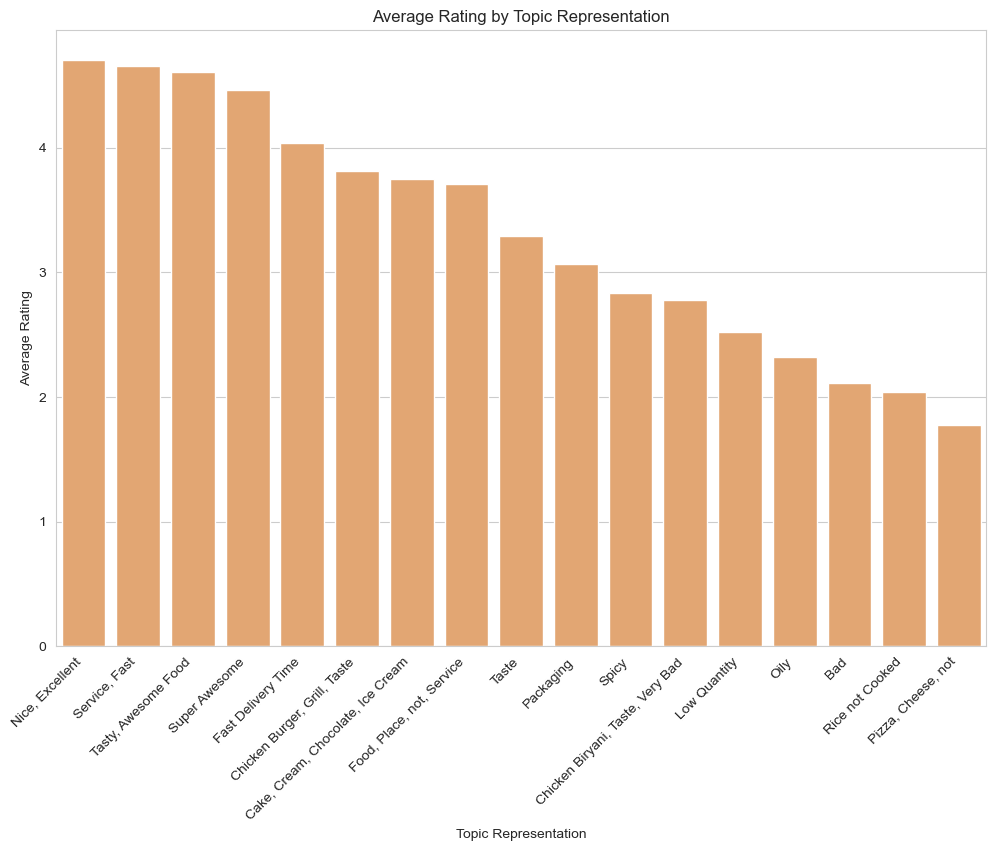

In [ ]:
mean_ratings = reviews.groupby('shrt_Topic_Representation')['Rating'].mean().sort_values(ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x=mean_ratings.index, y=mean_ratings.values, color='sandybrown')
plt.title('Average Rating by Topic Representation')
plt.xlabel('Topic Representation')
plt.ylabel('Average Rating')
plt.xticks(rotation=45, ha='right')
plt.show()

It can be clearly seen that topics that appear to be more positive have a higher average rating.

In [383]:
restaurants = pd.read_pickle('data/restaurants_initial_preproc.pkl')

In [387]:
reviews = pd.merge(reviews, restaurants[['Name','Cost','Collections','Cuisines']], left_on='Restaurant', right_on='Name', how='left')

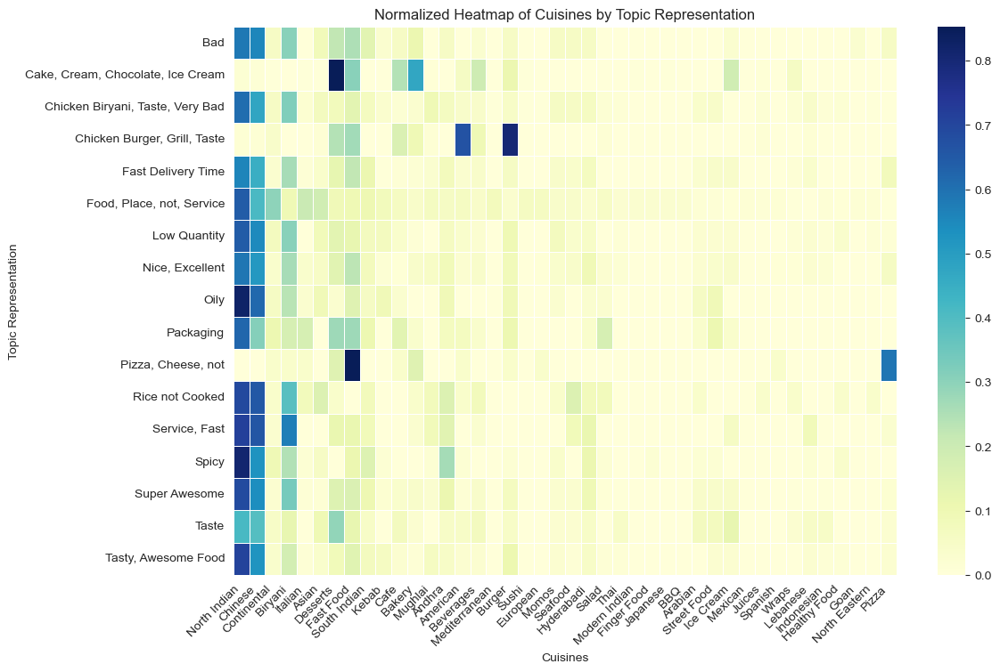

In [ ]:
cuisine_counts = reviews.explode('Cuisines')['Cuisines'].value_counts()
topic_counts = reviews['shrt_Topic_Representation'].value_counts()

reviews_cuisines = reviews.explode('Cuisines').groupby('shrt_Topic_Representation')['Cuisines'].value_counts().unstack().fillna(0).astype(int)
reviews_cuisines = reviews_cuisines[cuisine_counts.index]

# Normalizing the values
reviews_cuisines = reviews_cuisines.div(topic_counts, axis=0)

plt.figure(figsize=(12, 8))
sns.heatmap(reviews_cuisines, cmap='YlGnBu', linewidths=.5)
plt.title('Normalized Heatmap of Cuisines by Topic Representation')
plt.xlabel('Cuisines')
plt.ylabel('Topic Representation')
plt.xticks(rotation=45, ha='right')
plt.show()

Even though this visualization does not provide new insights on the topics or type of cuisines, this verifies that the topics are well formed as they are deeply correlated with the types of cuisines. <br>
For instance:
- Cake, Cream, Chocolate, Ice Cream in the cuisine Desserts and Bakery.
- Chicken Burger, Grill, Taste in American and Burger.
- Pizza, Cheese, not in Fast Food and Pizza.

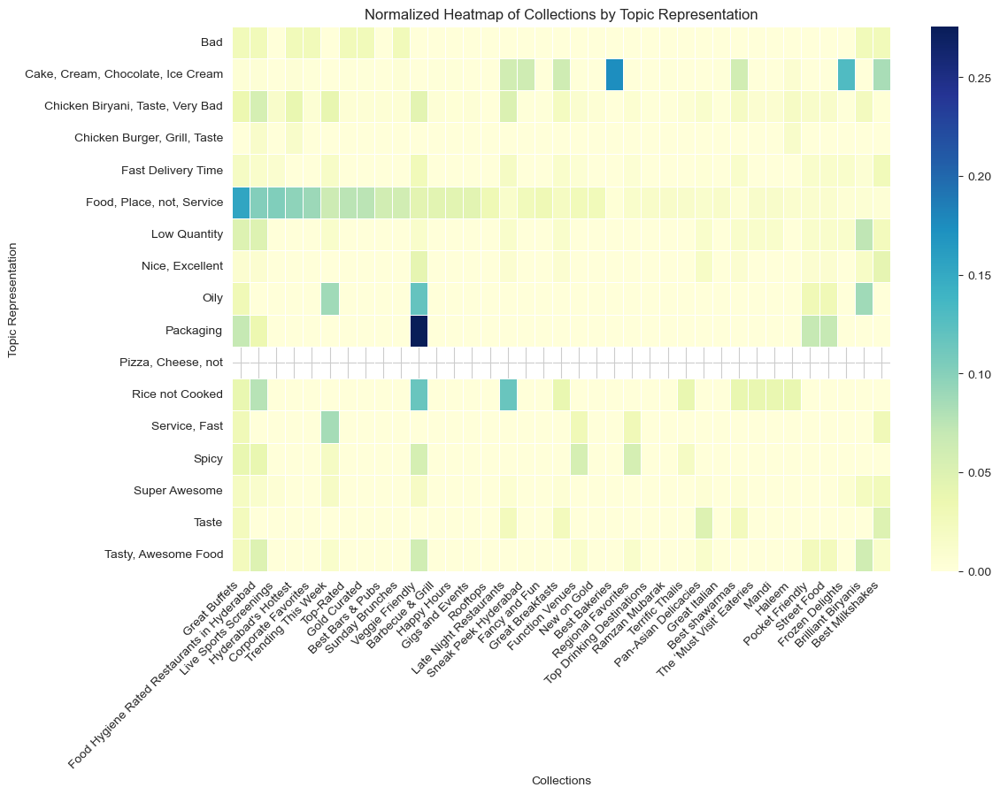

In [412]:
cuisine_counts = reviews.explode('Collections')['Collections'].value_counts()
topic_counts = reviews['shrt_Topic_Representation'].value_counts()

reviews_cuisines = reviews.explode('Collections').groupby('shrt_Topic_Representation')['Collections'].value_counts().unstack().fillna(0).astype(int)
reviews_cuisines = reviews_cuisines[cuisine_counts.index]

# Normalizing the values
reviews_cuisines = reviews_cuisines.div(topic_counts, axis=0)

plt.figure(figsize=(12, 8))
sns.heatmap(reviews_cuisines, cmap='YlGnBu', linewidths=.5)
plt.title('Normalized Heatmap of Collections by Topic Representation')
plt.xlabel('Collections')
plt.ylabel('Topic Representation')
plt.xticks(rotation=45, ha='right')
plt.show()

Here again no major insights but it is interesting to see the distribution of the topics by collections.

In [ ]:
sentiment = pd.read_pickle('data/sentiment_analysis.pkl')

In [ ]:
reviews = pd.merge(reviews, sentiment[['Restaurant','Reviewer','Time','content_polarity_vader','normalized_polarity_vader','normalized_score']], on=['Restaurant', 'Reviewer', 'Time'], how='left')

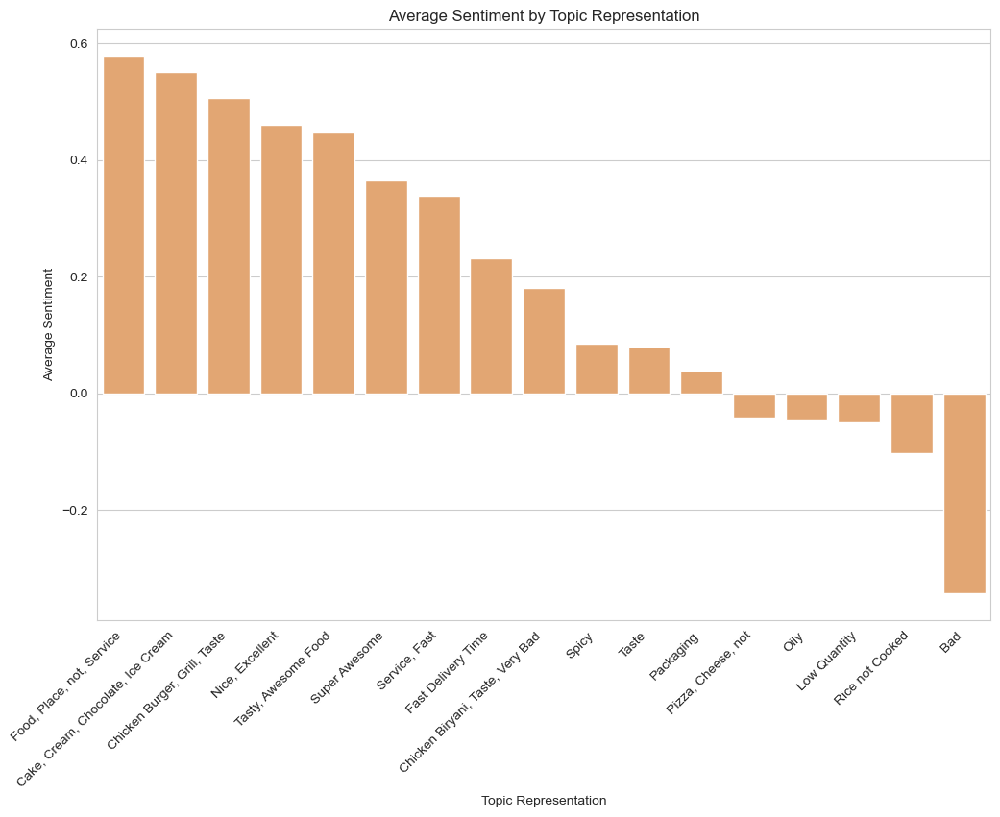

In [414]:
mean_ratings = reviews.groupby('shrt_Topic_Representation')['content_polarity_vader'].mean().sort_values(ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x=mean_ratings.index, y=mean_ratings.values, color='sandybrown')
plt.title('Average Sentiment by Topic Representation')
plt.xlabel('Topic Representation')
plt.ylabel('Average Sentiment')
plt.xticks(rotation=45, ha='right')
plt.show()

Finally, it was checked how the topics were distributed according to the overall sentiment computed in the notebook `Sentiment Analysis`.<br>
Once again they reflect the quality of the topic modelling.

### Grid Search (not used)

In [ ]:
class BERTopicWrapper(BaseEstimator, TransformerMixin):
    def __init__(self, n_gram_range=(1, 2), nr_topics=5, hdbscan_min_cluster_size=5, hdbscan_min_samples=None, 
                no_stopwords = True, lowercase=True, lemmatized=False, word_correction=False):
        self.n_gram_range = n_gram_range
        self.nr_topics = nr_topics
        self.hdbscan_min_cluster_size = hdbscan_min_cluster_size
        self.hdbscan_min_samples = hdbscan_min_samples
        self.model = None
        self.no_stopwords = no_stopwords
        self.lowercase = lowercase
        self.lemmatized = lemmatized
        self.word_correction = word_correction
        self.exception_stopwords = ['no','not','nor','very','few','all','again','but']

    def fit(self, X, y=None):
        # Configure HDBSCAN and the embedding model with the passed hyperparameters
        hdbscan_model = HDBSCAN(
            min_cluster_size=self.hdbscan_min_cluster_size,
            min_samples=self.hdbscan_min_samples)

        # Preprocess data according to passed hyperparameters
        X = X.apply(lambda review: main_pipeline(review,
                no_stopwords = self.no_stopwords,
                exception_stopwords=self.exception_stopwords,
                convert_diacritics = True, 
                lowercase = self.lowercase, 
                lemmatized = self.lemmatized,
                stemmed = False, 
                pos_tags_list = "no_pos",
                tokenized_output = False,
                word_correction=self.word_correction))

        # Initialize BERTopic with the custom HDBSCAN model and embedding model
        self.model = BERTopic(
            n_gram_range=self.n_gram_range,
            nr_topics=self.nr_topics,
            hdbscan_model=hdbscan_model,
            verbose=True
        )

        self.model.fit(X)
        return self

    def transform(self, X):
        return self.model.transform(X)

    def compute_coherence_score(self, X, coherence='c_v'):
        return compute_coherence_score(self.model, X, coherence=coherence)

# Define parameter grid
param_grid = {
    "n_gram_range": [(1, 1), (1, 2)],
    "nr_topics": [5],
    "hdbscan_min_cluster_size": [75],
    "hdbscan_min_samples": [10, 25],
    'no_stopwords' : [True, False], 
    'lowercase' : [True, False],
    'word_correction' : [True, False]}

def coherence_score(estimator, X, y=None):
    return estimator.compute_coherence_score(X)

# Perform grid search
grid_search = GridSearchCV(
    BERTopicWrapper(),
    param_grid,
    scoring=coherence_score,
    cv=3,
    verbose=2,
    n_jobs=-1
)

grid_search.fit(reviews["Review"].reset_index(drop=True))

# Best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Coherence Score:", grid_search.best_score_)